In [13]:
import cv2
import numpy as np
import torch
import torchvision.transforms as T
from PIL import Image, ImageDraw
from matplotlib.pyplot import imshow
%matplotlib inline

In [14]:
renders_dir = 'renders_output/strong_f_loss_optimize_features_loss_separately/'

# Check over 92 and 93 those are images where I know there are points we see on both images
image_1_features_path = renders_dir + 'out_0_features.pt'
image_1_path = renders_dir + 'in_0_image.pt'
depth_1_path = renders_dir + 'in_0_gt_depth.pt'

image_2_features_path = renders_dir + 'out_1_features.pt'
image_2_path = renders_dir + 'in_1_image.pt'
depth_2_path = renders_dir + 'in_1_gt_depth.pt'

# In format of tev's (h, w) (in tev it is written (w,h) you can know by moving the cursor from left to right over an image)
points_to_check = [(30, 900)]#, (35, 129), (54, 160), (162, 47)]
colors = [np.array([0,0,255]), np.array([255,0,0]), np.array([0,255,0]), np.array([255,255,0])]

img_1_tensor = torch.load(image_1_path)
img_2_tensor = torch.load(image_2_path)
features_1 = torch.load(image_1_features_path).numpy()
features_2 = torch.load(image_2_features_path).numpy()
depth_1 = torch.load(depth_1_path).numpy()
depth_2 = torch.load(depth_2_path).numpy()

Find matching points from supervision:

In [15]:
depth_idx_1 = depth_1[~np.isnan(depth_1[:,:,0]),2]
depth_idx_2 = depth_2[~np.isnan(depth_2[:,:,0]),2]

idxs_in_both = depth_idx_1[np.isin(depth_idx_1, depth_idx_2)]
idxs_in_both.shape

(690,)

In [16]:
# Samples points to check in image 1:
points_N = 5
np.random.seed(1)

points_to_check_idx = idxs_in_both[np.random.choice(idxs_in_both.shape[0], points_N, replace=False)]

points_to_check = np.argwhere(np.isin(depth_1[:,:,2], points_to_check_idx))
print('Points to check in image 1:', points_to_check)

# Provide the gt:
matching_points = []
for p in points_to_check:
    p_colmap_idx = depth_1[p[0],p[1],2]
    matching_points.append(np.argwhere(depth_2[:,:,2] == p_colmap_idx)[0])
matching_points = np.array(matching_points)
print('Mathcing points in image 2:', matching_points)

print(depth_1[points_to_check[:,0], points_to_check[:,1], 2])
print(depth_2[matching_points[:,0], matching_points[:,1], 2])

Points to check in image 1: [[ 89 669]
 [163 206]
 [574 199]
 [711 822]
 [728 565]]
Mathcing points in image 2: [[ 98 696]
 [183 226]
 [577 230]
 [733 852]
 [740 586]]
[11003. 12246. 12254. 13523.   611.]
[11003. 12246. 12254. 13523.   611.]


In [17]:
def cos_sim(a, b, axis=2):
    return (a * b).sum(axis=axis) / (np.linalg.norm(a, axis=axis) * np.linalg.norm(b, axis=axis))

# a_check = np.array([
#   [1,2,1],
#     # [1,2,1],
#     # [2,4,2],
#     # [1,0,0],
#     # [0,0,1],
#     # [1,0,0]
# ])
# b_check = np.array([
#   [1,2,1],
#     [2,4,2],
#     [1,2,1],
#     [0,0,1],
#     [1,0,0],
#     [1,1,0]
# ])

# cos_sim(a_check, b_check, axis=1)

Now search for nearest and render

[ 89 669]
[ 89 669]
[ 83 711] 0.9955384
[ 84 711] 0.9954839
[ 83 712] 0.9954744
[ 82 711] 0.9952059
[ 82 712] 0.99512994
Cosine Similarity to gt match [ 98 696]  : 0.98786324
[163 206]


/tmp/ipykernel_3595/2485693389.py:2: RuntimeWarning: invalid value encountered in divide
  return (a * b).sum(axis=axis) / (np.linalg.norm(a, axis=axis) * np.linalg.norm(b, axis=axis))


[163 206]
[183 226] 0.9847672
[182 226] 0.9839448
[183 227] 0.9834935
[182 225] 0.9829383
[183 225] 0.98276514
Cosine Similarity to gt match [183 226]  : 0.9847672
[574 199]
[574 199]
[578 230] 0.99222714
[578 231] 0.99194497
[571 228] 0.9915804
[577 229] 0.99138355
[577 231] 0.99133945
Cosine Similarity to gt match [577 230]  : 0.99034774
[711 822]
[711 822]
[733 852] 0.9910873
[733 851] 0.9894049
[732 852] 0.98909116
[734 851] 0.9889731
[733 853] 0.98873866
Cosine Similarity to gt match [733 852]  : 0.9910873
[728 565]
[728 565]
[739 587] 0.9909973
[738 587] 0.9899199
[739 588] 0.9896413
[740 588] 0.9893784
[738 586] 0.9893299
Cosine Similarity to gt match [740 586]  : 0.9861941


'img1'

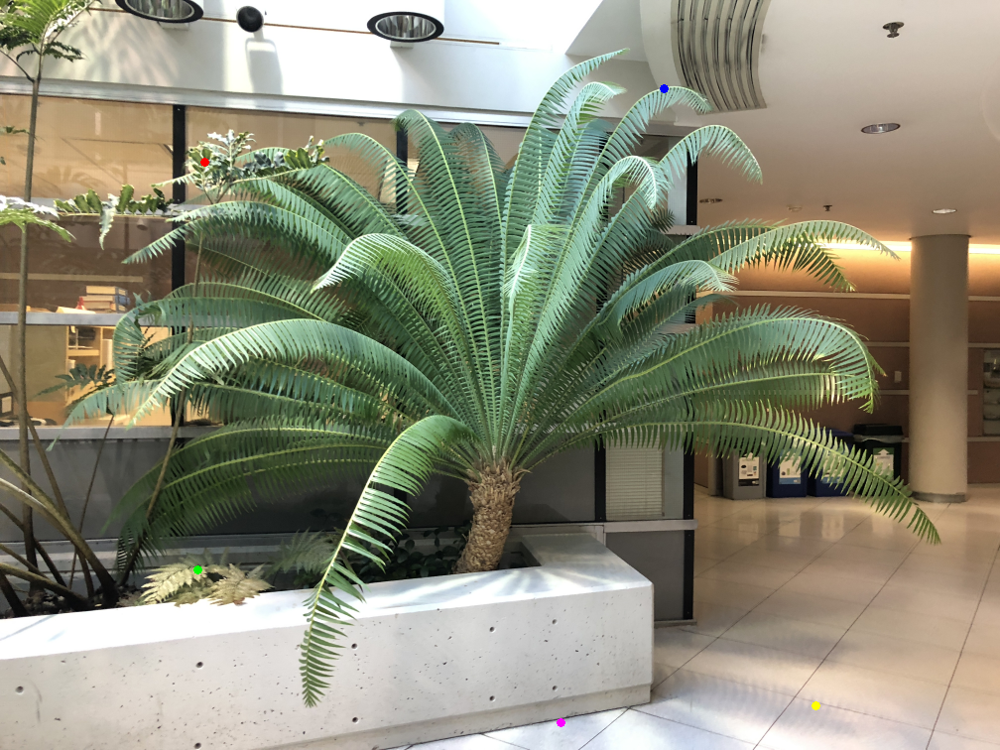

'img2 preds'

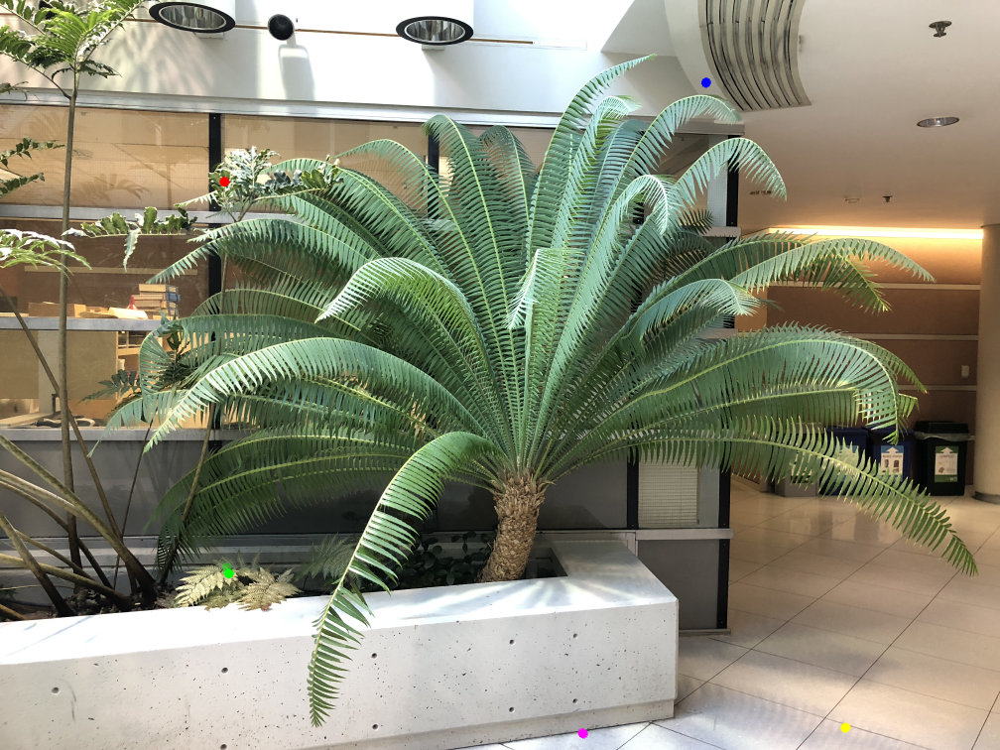

'img2 labels'

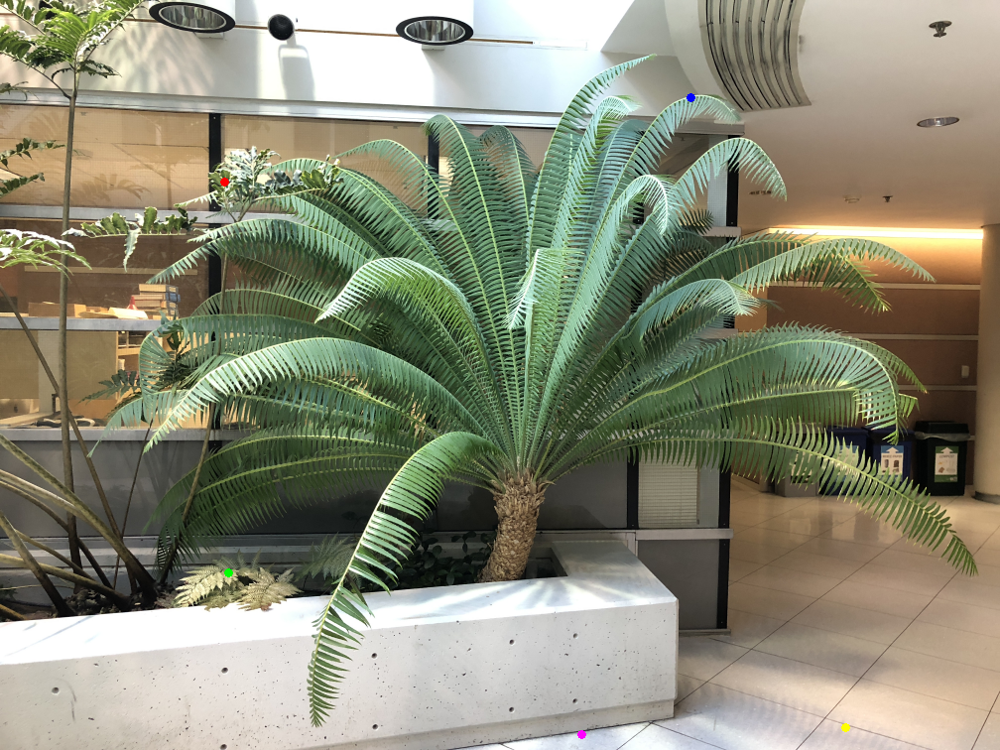

0

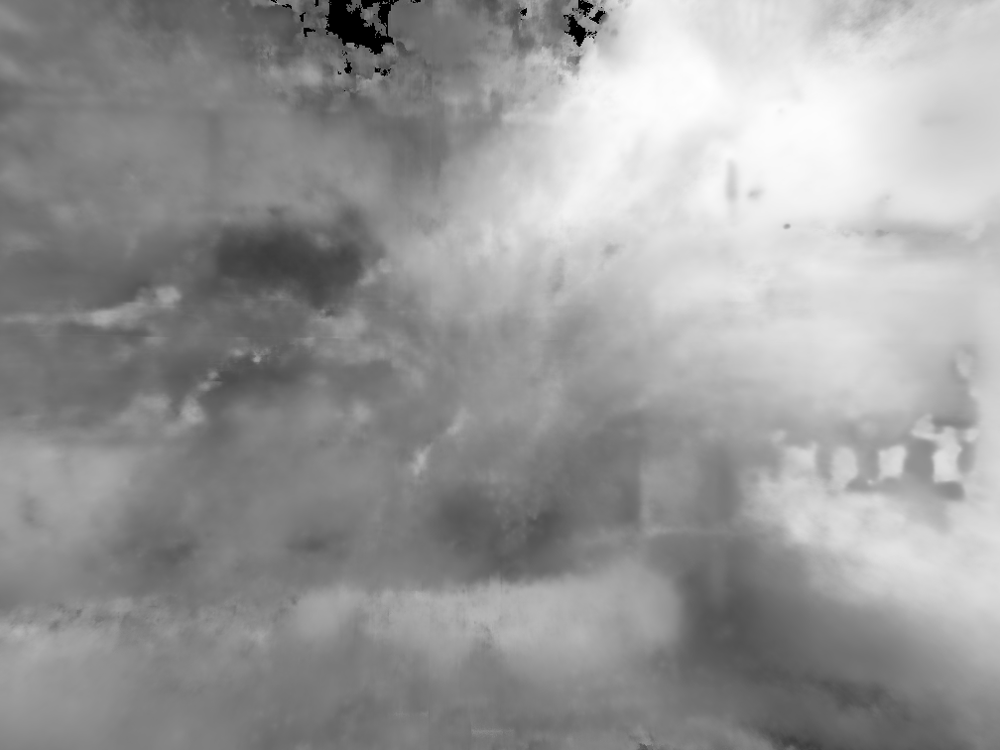

1

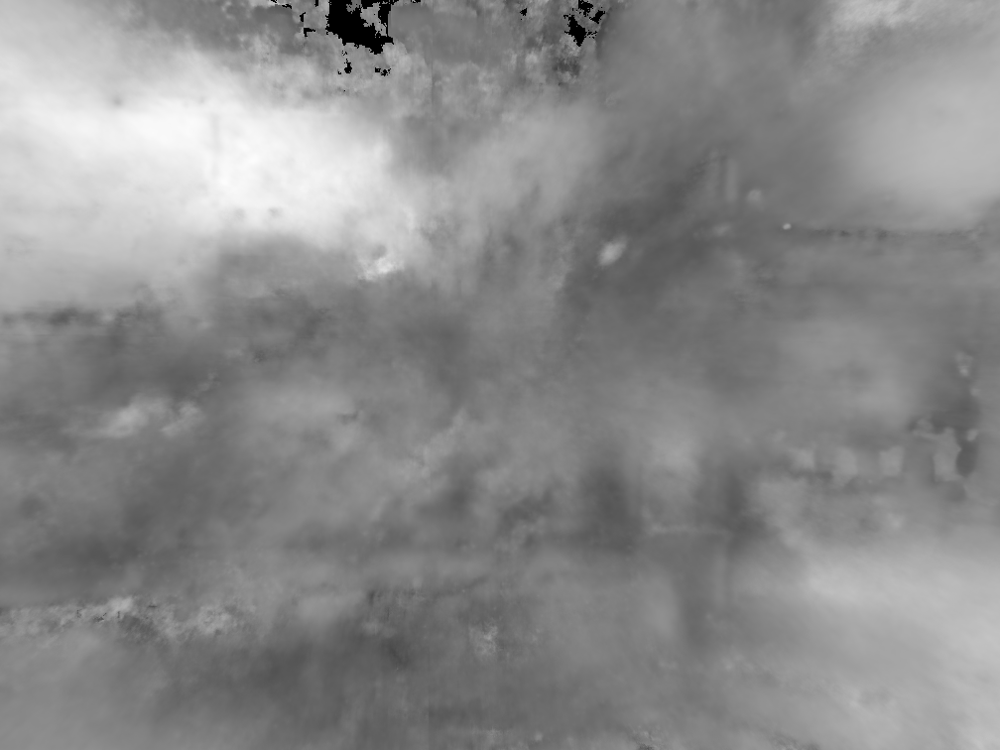

2

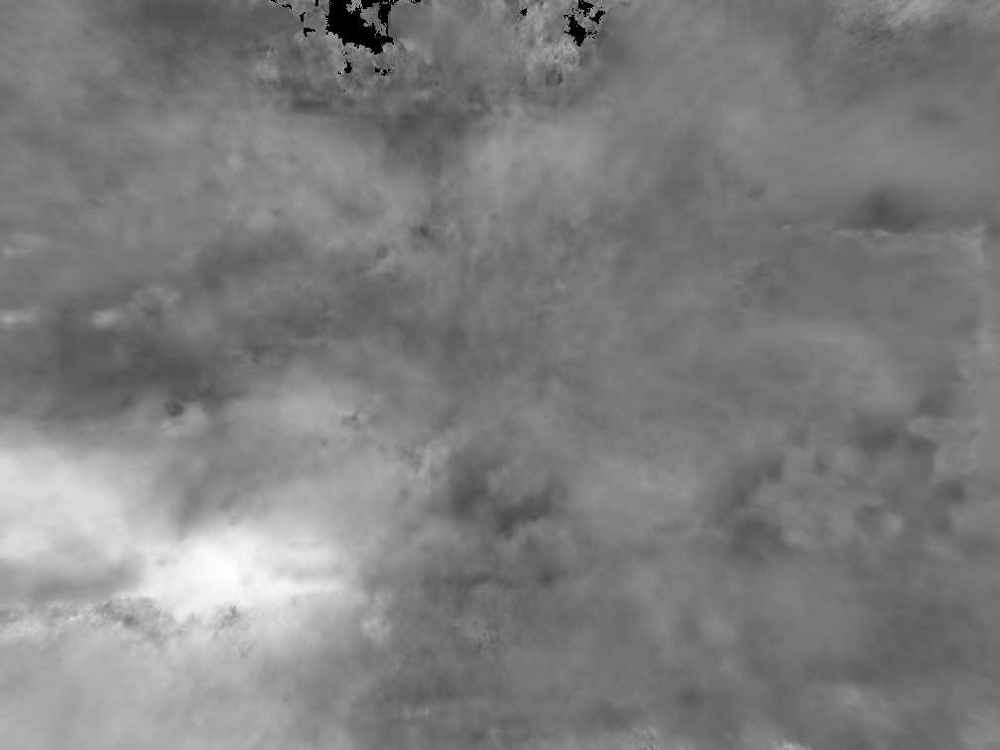

3

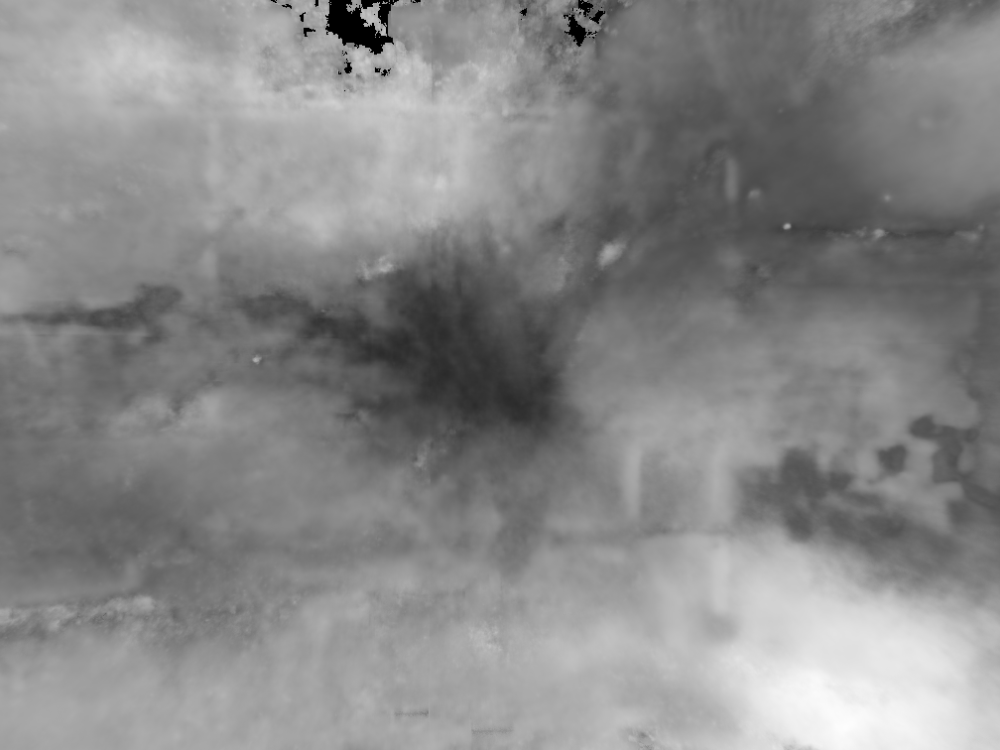

4

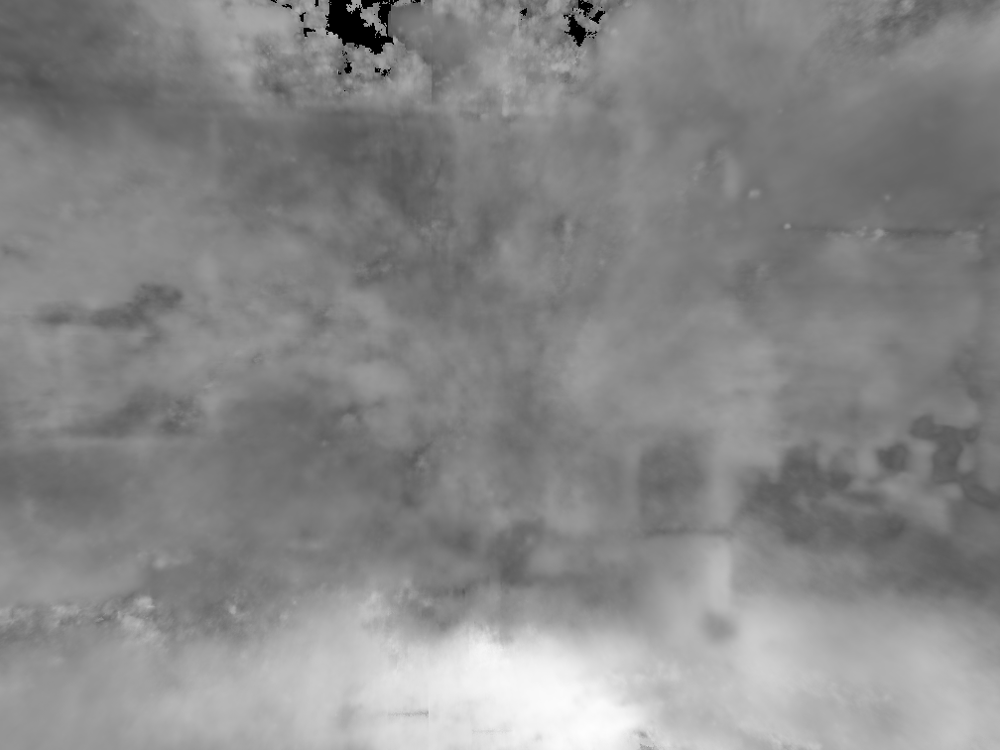

In [18]:
to_pil_image = T.ToPILImage()
colors = [
    np.array([0,0,255]), np.array([255,0,0]), np.array([0,255,0]),
    np.array([255,255,0]), np.array([255,0,255]), np.array([255,255,255])
]

# hwc to chw
img_1 = to_pil_image(img_1_tensor.permute(2, 0, 1))
img_2_for_labels = to_pil_image(img_2_tensor.permute(2, 0, 1))
img_2_for_preds = img_2_for_labels.copy()

orig_draw_r = 4
found_draw_r = 4
k = 5
img_1_drw = ImageDraw.Draw(img_1, 'RGBA')
img_2_gt_drw = ImageDraw.Draw(img_2_for_labels, 'RGBA')
img_2_preds_drw = ImageDraw.Draw(img_2_for_preds, 'RGBA')

heat_maps = []

for i, point in enumerate(points_to_check):
    gt_match = matching_points[i]
    # Draw on source image to see it
    print(point)
    # Draw ellipse given a bounding box of (x0,y0,x1,y1), x in width, y in height, x1>x0 y1>y0
    img_1_drw.ellipse(xy=(point[1] - orig_draw_r, point[0] - orig_draw_r, \
                          point[1] + orig_draw_r, point[0] + orig_draw_r), fill=tuple(colors[i]))

    # Fine nearest Neighbors
    point_features = features_1[point[0], point[1]]
    # distances = ((features_2 - point_features) ** 2).sum(axis=-1)
    distances = cos_sim(features_2, point_features[np.newaxis, np.newaxis,...])
    nearest_idxs = np.dstack(np.unravel_index(np.argsort(-distances, axis=None), distances.shape))[0, :k, ...]

    print(point)
    for n_p in nearest_idxs:
        print(n_p, distances[n_p[0], n_p[1]])

    nearest_p = nearest_idxs[0]
    # Draw ellipse given a bounding box of (x0,y0,x1,y1), x in width, y in height, x1>x0 y1>y0
    img_2_preds_drw.ellipse(xy=(nearest_p[1] - found_draw_r, nearest_p[0] - found_draw_r, \
                          nearest_p[1] + found_draw_r, nearest_p[0] + found_draw_r), fill=tuple(colors[i]))
    # Now draw next matches with lower 
    for near_p in nearest_idxs[1:]:
        img_2_preds_drw.ellipse(xy=(near_p[1] - found_draw_r, near_p[0] - found_draw_r, \
                              near_p[1] + found_draw_r, near_p[0] + found_draw_r),
                          fill=(colors[i][0], colors[i][1], colors[i][2], 100))
        
    # Draw the gt
    img_2_gt_drw.ellipse(xy=(gt_match[1] - found_draw_r, gt_match[0] - found_draw_r, \
                          gt_match[1] + found_draw_r, gt_match[0] + found_draw_r), fill=tuple(colors[i]))
    print('Cosine Similarity to gt match', gt_match, ' :' , cos_sim(point_features, features_2[gt_match[0], gt_match[1]], axis=0))
    
    heat_maps.append((distances + 1)/2)

display('img1', (img_1))
display('img2 preds', (img_2_for_preds))
display('img2 labels', (img_2_for_labels))

for i, h_map in enumerate(heat_maps):
    h_map_as_img = to_pil_image((np.dstack([h_map, h_map, h_map]) * 255).astype(dtype=np.uint8))
    display(i, h_map_as_img)
    



In [19]:
feats_to_check = features_1[points_to_check[:,0], points_to_check[:,1], :]
matching_feats = features_2[matching_points[:,0], matching_points[:,1], :]

print('Cosine Similarity with the gt:')
print(cos_sim(feats_to_check, matching_feats, axis=1))

print('Cosine Similarity with false gt:')
print(cos_sim(np.roll(feats_to_check, 1, axis=0), matching_feats, axis=1))

Cosine Similarity with the gt:
[0.98786324 0.9847672  0.99034774 0.9910873  0.9861941 ]
Cosine Similarity with false gt:
[-0.01602526  0.0449519   0.09616493 -0.10709794  0.37329248]


In [20]:
# TODO: 
#  1. Search matches for points from the non-matched colmap points. See their heatmaps.
#    This is an intermediate step since they don't need more depth supervision,
#    but they are good keypoints not from the supervision to check.
#  2. Search matches for random points in img_1. See their heatmaps

## Check Over non-gt points

 NOTE: it might be DATA LEAKAGE since we use points depth in the training from other image. And those might be from the points we sample here - depth points from COLMAP that aren't found by colmap in both images.. if the other point founda  match from another training image to img_1 then it's ok, otherwise it isn't..

In [21]:
# Samples points to check in image 1:
points_N = 5
np.random.seed(2)
idxs_only_in_1 = depth_idx_1[~np.isin(depth_idx_1, depth_idx_2)]

points_to_check_idx = idxs_only_in_1[np.random.choice(idxs_only_in_1.shape[0], points_N, replace=False)]

points_to_check = np.argwhere(np.isin(depth_1[:,:,2], points_to_check_idx))
print('Points to check in image 1:', points_to_check)

Points to check in image 1: [[ 16 398]
 [158 305]
 [160 210]
 [489 818]
 [574  58]]


[ 16 398]
[ 16 398]
[ 16 432] 0.9919027
[ 17 432] 0.9916214
[ 16 433] 0.99143785
[ 17 433] 0.9914222
[ 18 432] 0.9913088
[158 305]


/tmp/ipykernel_3595/2485693389.py:2: RuntimeWarning: invalid value encountered in divide
  return (a * b).sum(axis=axis) / (np.linalg.norm(a, axis=axis) * np.linalg.norm(b, axis=axis))


[158 305]
[156 340] 0.9913224
[155 340] 0.9903739
[156 339] 0.9902866
[157 340] 0.9901773
[156 341] 0.98999506
[160 210]
[160 210]
[160 255] 0.9700339
[161 254] 0.9698872
[159 257] 0.9695266
[159 256] 0.96935093
[161 255] 0.96851766
[489 818]
[489 818]
[477 840] 0.99067974
[476 840] 0.99038
[477 841] 0.9892475
[478 842] 0.9887564
[478 843] 0.9881611
[574  58]
[574  58]
[564 110] 0.9904531
[564 111] 0.9903157
[563 110] 0.98945147
[565 110] 0.98926073
[564 112] 0.9891037


'img1'

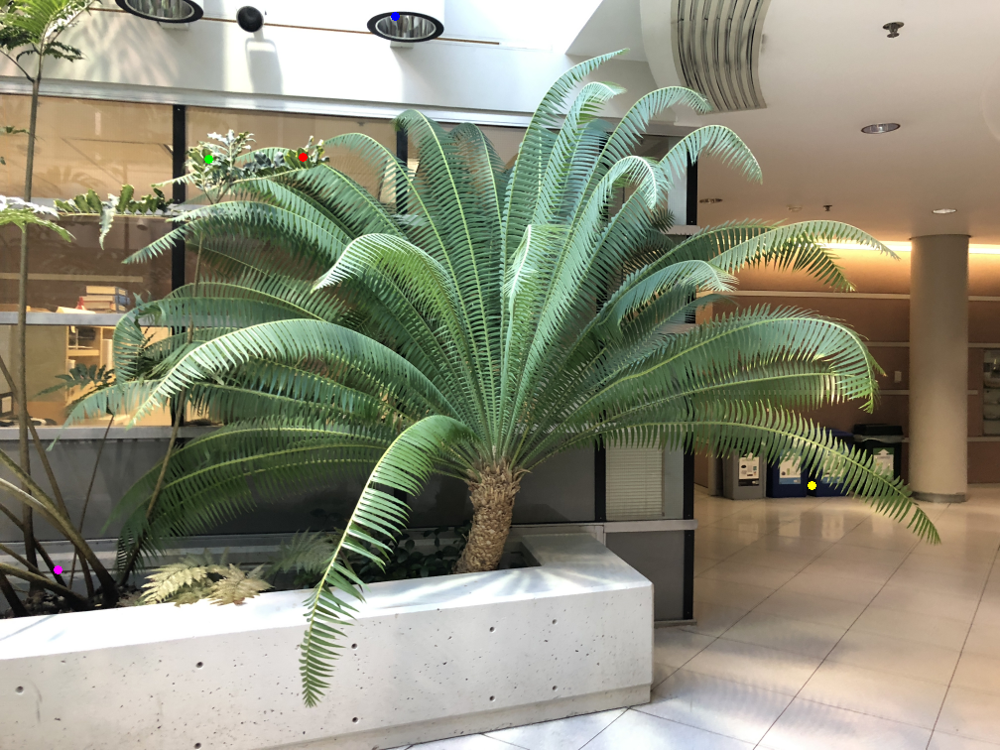

'img2 preds'

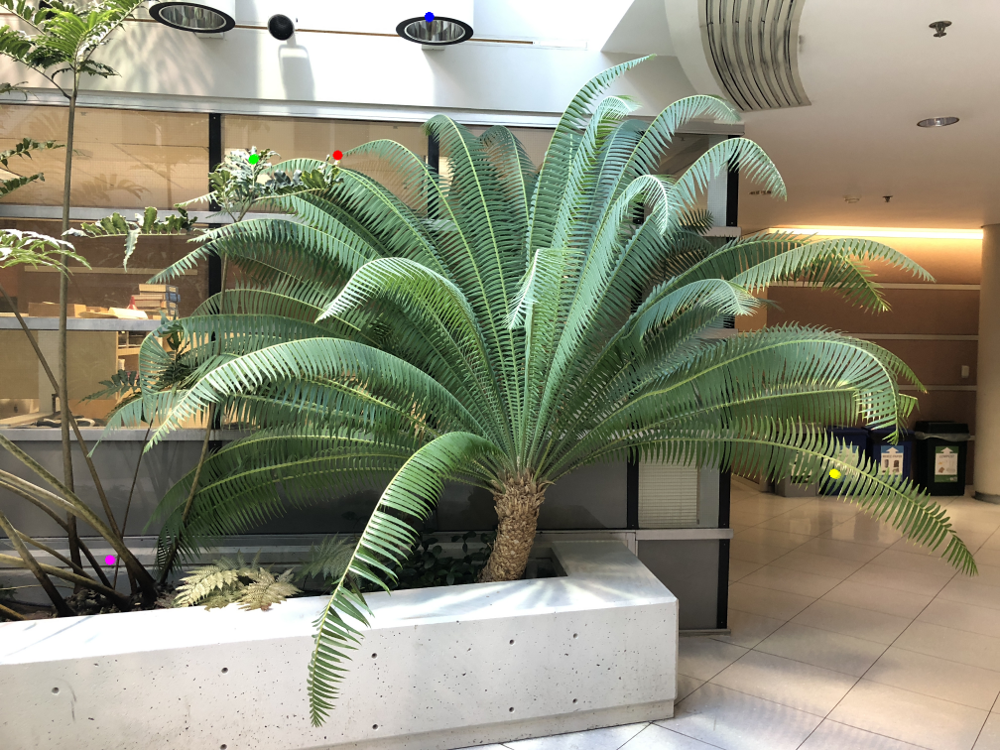

0

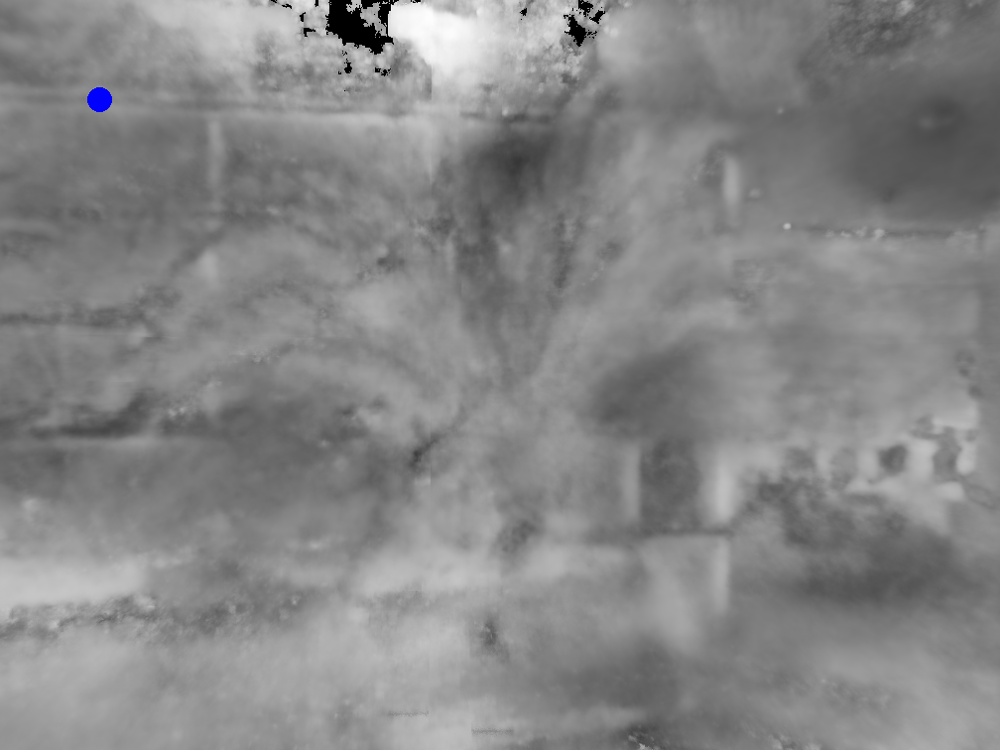

1

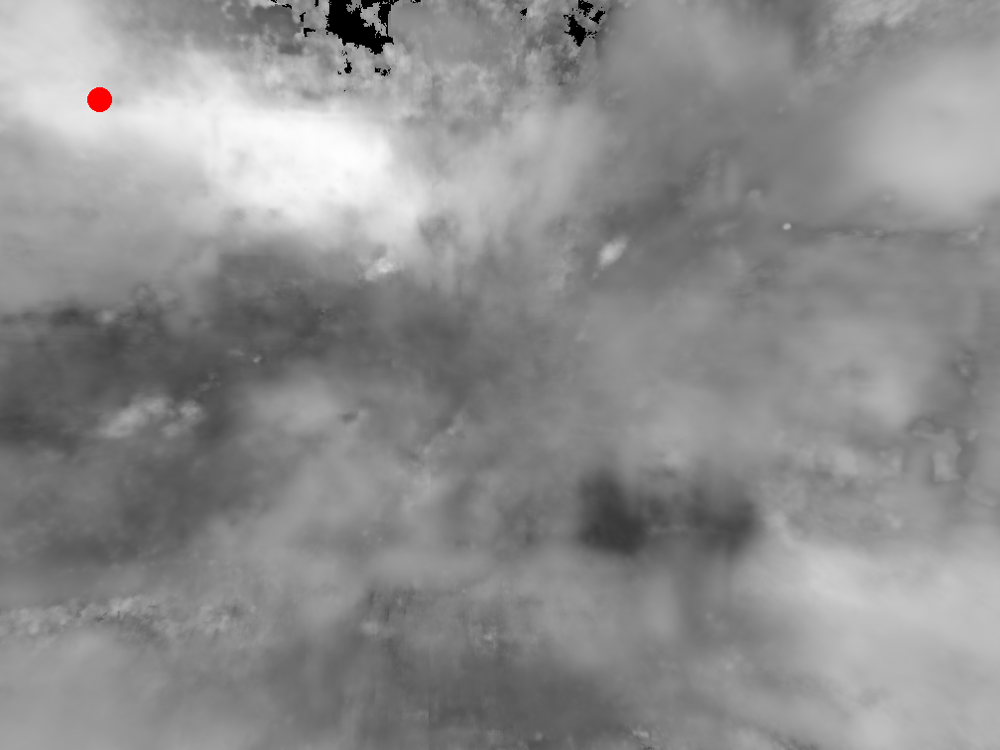

2

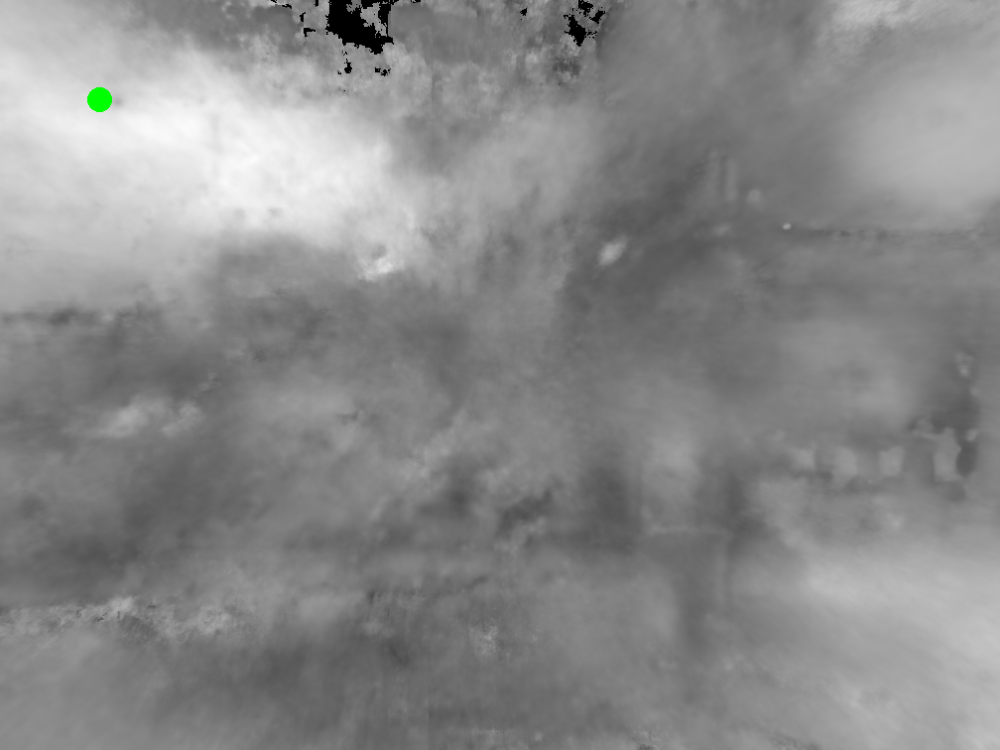

3

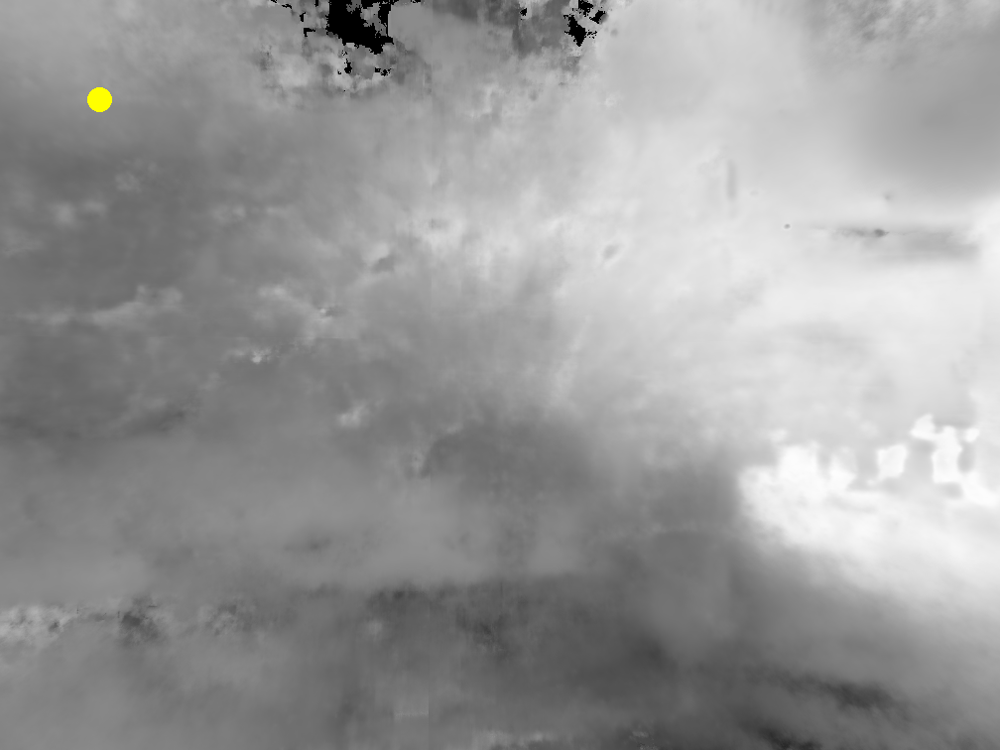

4

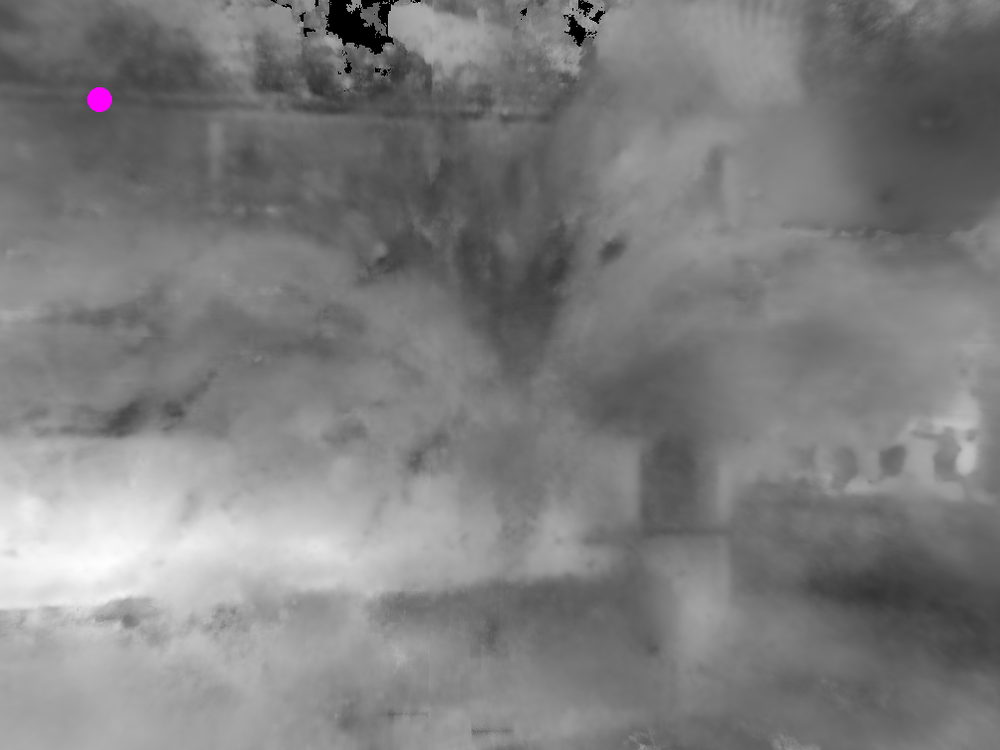

In [22]:
to_pil_image = T.ToPILImage()
colors = [
    np.array([0,0,255]), np.array([255,0,0]), np.array([0,255,0]),
    np.array([255,255,0]), np.array([255,0,255]), np.array([255,255,255])
]

# hwc to chw
img_1 = to_pil_image(img_1_tensor.permute(2, 0, 1))
img_2_for_preds = to_pil_image(img_2_tensor.permute(2, 0, 1))

orig_draw_r = 4
found_draw_r = 4
k = 5
img_1_drw = ImageDraw.Draw(img_1, 'RGBA')
img_2_preds_drw = ImageDraw.Draw(img_2_for_preds, 'RGBA')

heat_maps = []

for i, point in enumerate(points_to_check):
    # Draw on source image to see it
    print(point)
    # Draw ellipse given a bounding box of (x0,y0,x1,y1), x in width, y in height, x1>x0 y1>y0
    img_1_drw.ellipse(xy=(point[1] - orig_draw_r, point[0] - orig_draw_r, \
                          point[1] + orig_draw_r, point[0] + orig_draw_r), fill=tuple(colors[i]))

    # Fine nearest Neighbors
    point_features = features_1[point[0], point[1]]
    # distances = ((features_2 - point_features) ** 2).sum(axis=-1)
    distances = cos_sim(features_2, point_features[np.newaxis, np.newaxis,...])
    nearest_idxs = np.dstack(np.unravel_index(np.argsort(-distances, axis=None), distances.shape))[0, :k, ...]

    print(point)
    for n_p in nearest_idxs:
        print(n_p, distances[n_p[0], n_p[1]])

    nearest_p = nearest_idxs[0]
    # Draw ellipse given a bounding box of (x0,y0,x1,y1), x in width, y in height, x1>x0 y1>y0
    img_2_preds_drw.ellipse(xy=(nearest_p[1] - found_draw_r, nearest_p[0] - found_draw_r, \
                          nearest_p[1] + found_draw_r, nearest_p[0] + found_draw_r), fill=tuple(colors[i]))
    # Now draw next matches with lower 
    for near_p in nearest_idxs[1:]:
        img_2_preds_drw.ellipse(xy=(near_p[1] - found_draw_r, near_p[0] - found_draw_r, \
                              near_p[1] + found_draw_r, near_p[0] + found_draw_r),
                          fill=(colors[i][0], colors[i][1], colors[i][2], 100))
    
    # Heatmaps:
    cur_heatmap = (distances + 1)/2
    cur_heatmap_as_img = to_pil_image((np.dstack([cur_heatmap, cur_heatmap, cur_heatmap]) * 255).astype(dtype=np.uint8))
    cur_heatmap_drw = ImageDraw.Draw(cur_heatmap_as_img, 'RGBA')
    cur_heatmap_drw.ellipse(xy=(100 - 3 * orig_draw_r, 100 - 3 * orig_draw_r, \
                          100 + 3 * orig_draw_r, 100 + 3 * orig_draw_r), fill=tuple(colors[i]))
    heat_maps.append(cur_heatmap_as_img)

display('img1', (img_1))
display('img2 preds', (img_2_for_preds))

for i, h_map in enumerate(heat_maps):
    # h_map_as_img = to_pil_image((np.dstack([h_map, h_map, h_map]) * 255).astype(dtype=np.uint8))
    display(i, h_map)
    


## Check Over Random Points

In [23]:
# Samples points to check in image 1:
points_N = 5
np.random.seed(2)

points_to_check = np.vstack([
    np.random.choice(depth_1.shape[0], points_N, replace=False),
    np.random.choice(depth_1.shape[1], points_N, replace=False)]).T

print('Points to check in image 1:', points_to_check)

Points to check in image 1: [[381 173]
 [488 435]
 [651 136]
 [531 805]
 [ 67 276]]


[381 173]
[381 173]
[385 223] 0.9595546
[364 238] 0.95916677
[373 209] 0.95708025
[381 209] 0.95704305
[382 210] 0.95643175
[488 435]


/tmp/ipykernel_3595/2485693389.py:2: RuntimeWarning: invalid value encountered in divide
  return (a * b).sum(axis=axis) / (np.linalg.norm(a, axis=axis) * np.linalg.norm(b, axis=axis))


[488 435]
[491 465] 0.965825
[492 465] 0.9647262
[493 465] 0.96444756
[492 466] 0.9635154
[490 465] 0.9620474
[651 136]
[651 136]
[621 203] 0.9650322
[623 212] 0.963747
[621 204] 0.96255404
[622 203] 0.962077
[622 202] 0.9608152
[531 805]
[531 805]
[528 863] 0.9899525
[527 863] 0.9898893
[527 864] 0.98957294
[528 864] 0.989533
[527 862] 0.989476
[ 67 276]
[ 67 276]
[ 51 336] 0.9865198
[ 51 337] 0.9725879
[ 50 336] 0.96147394
[ 52 337] 0.9597668
[ 50 335] 0.9447969


'img1'

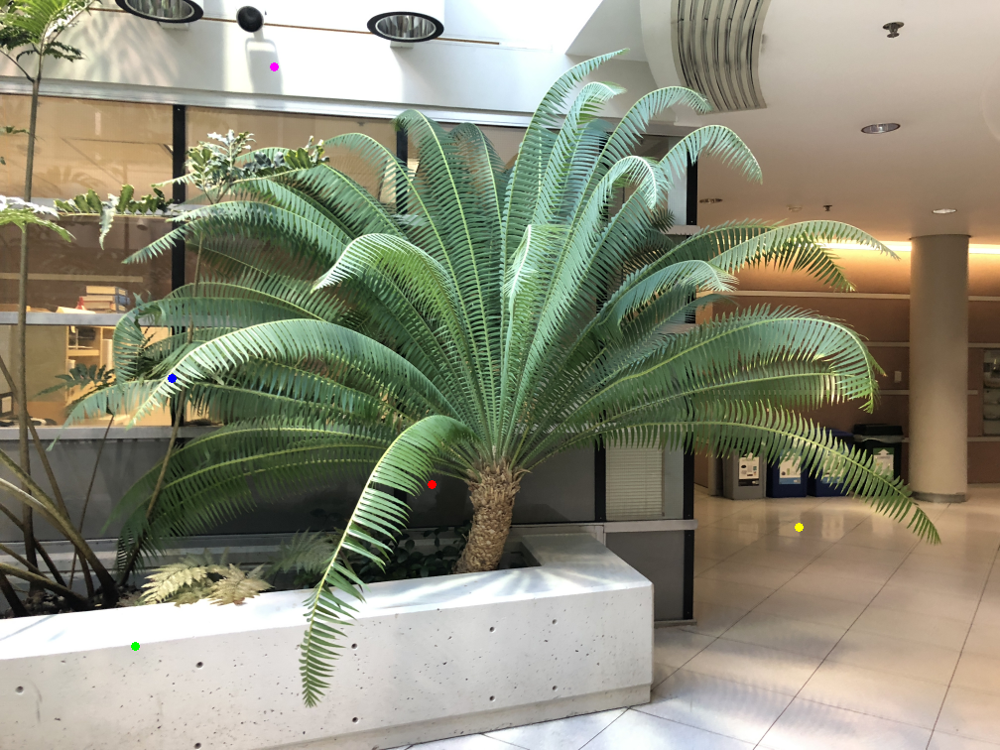

'img2 preds'

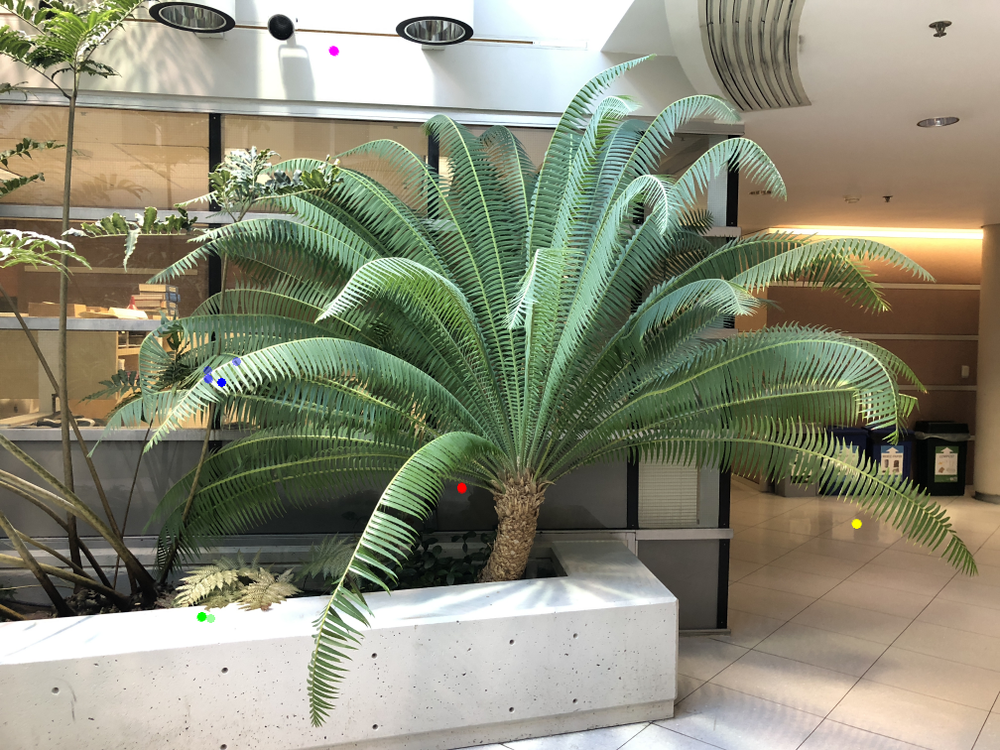

0

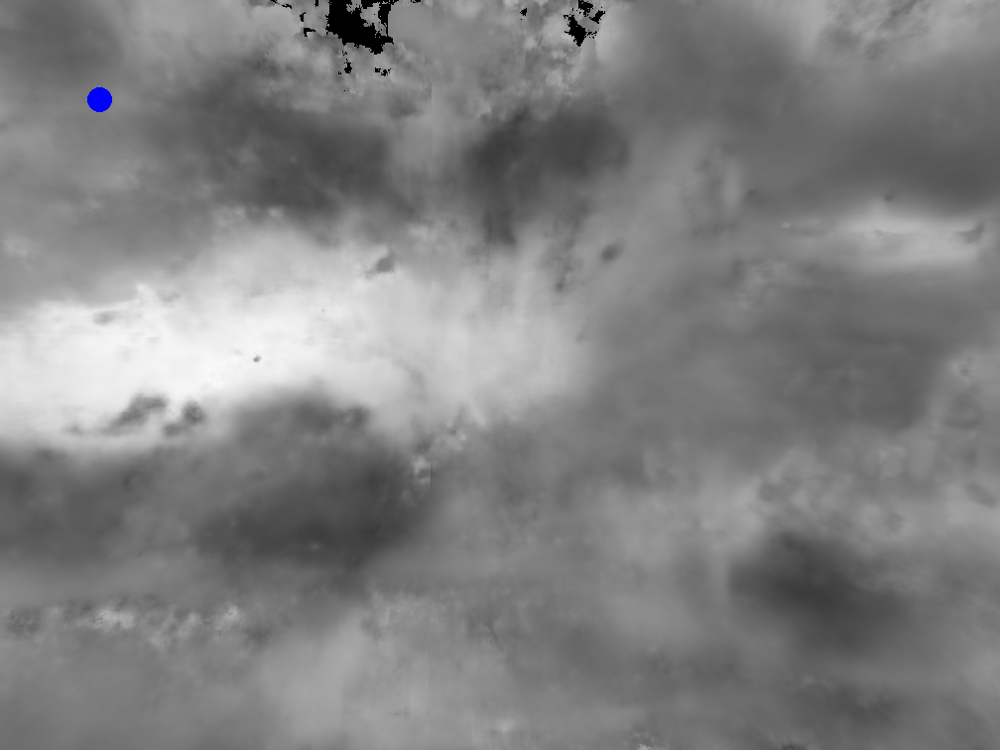

1

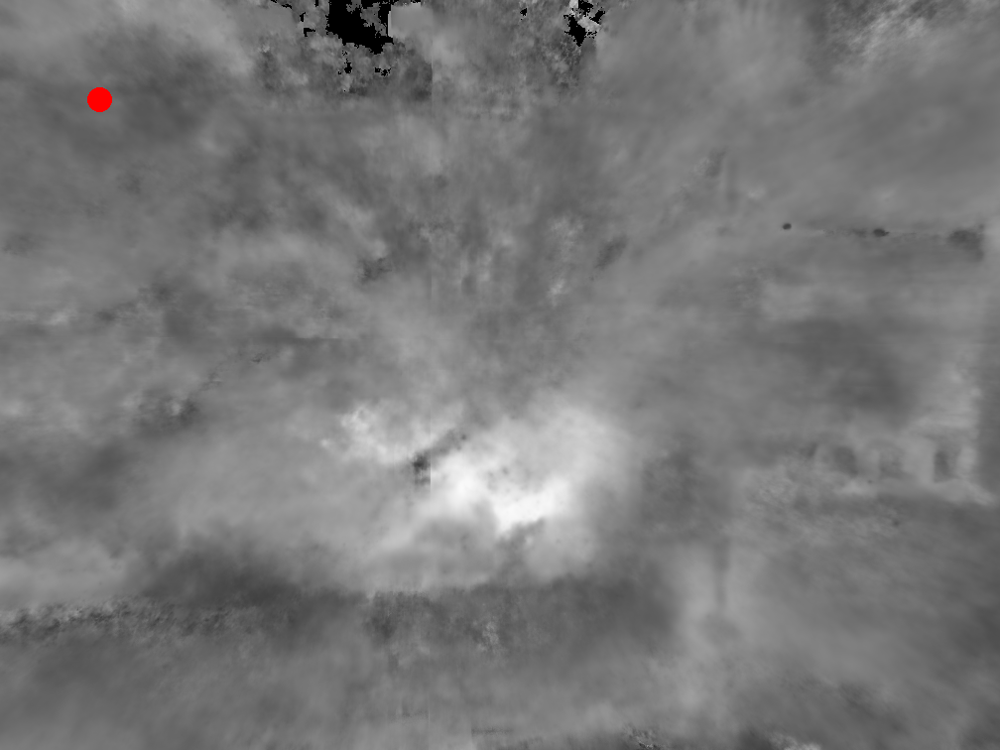

2

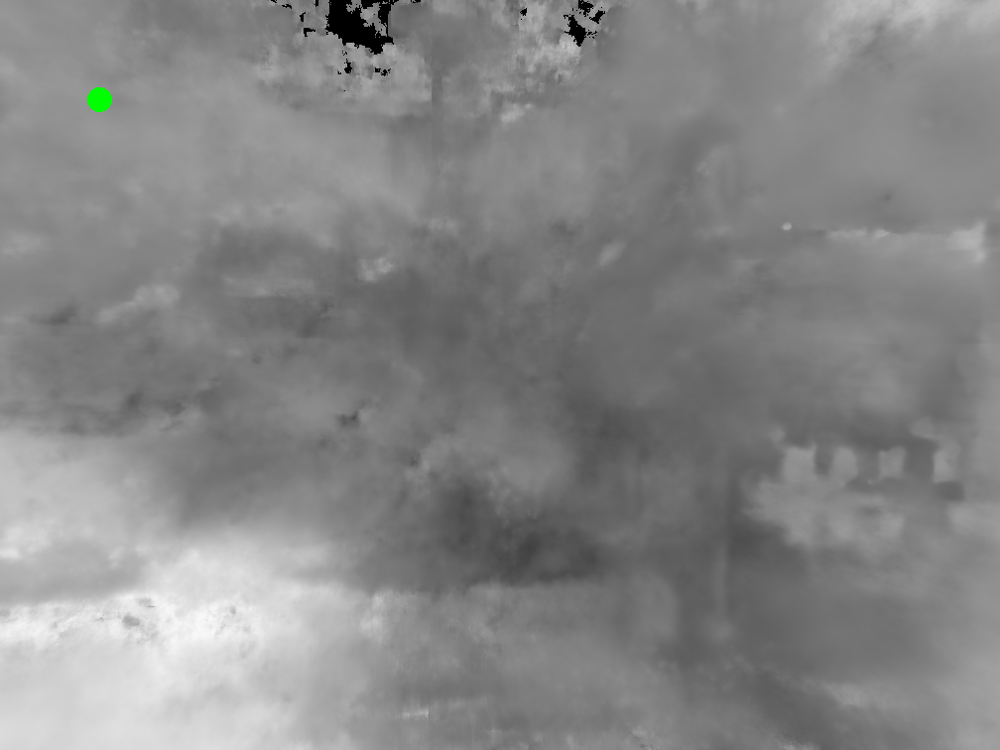

3

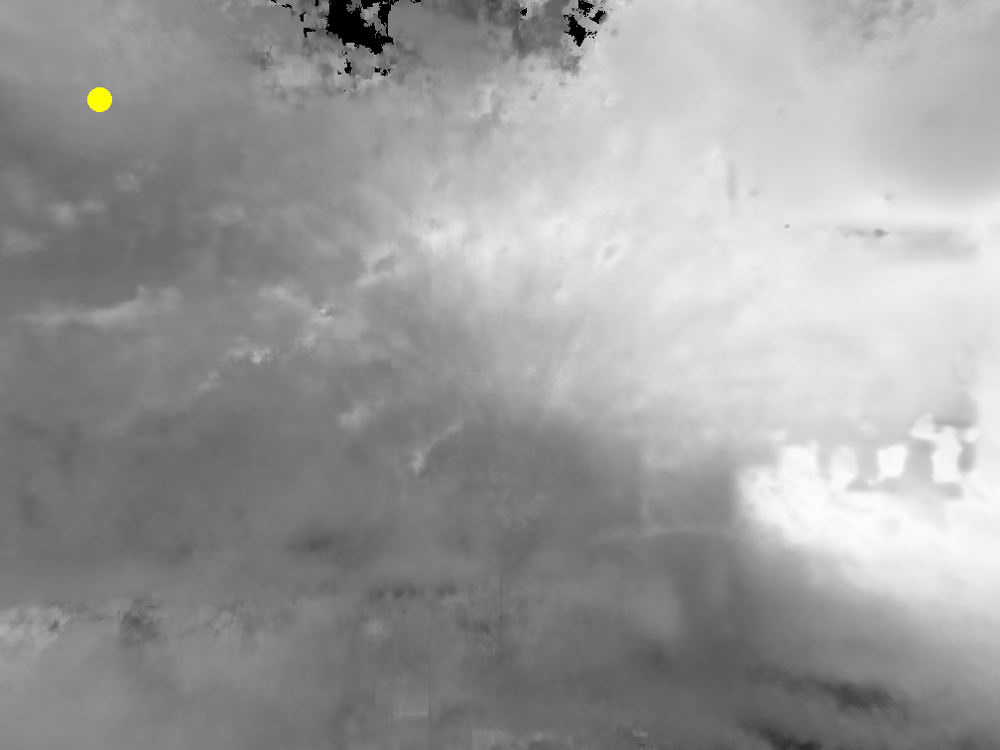

4

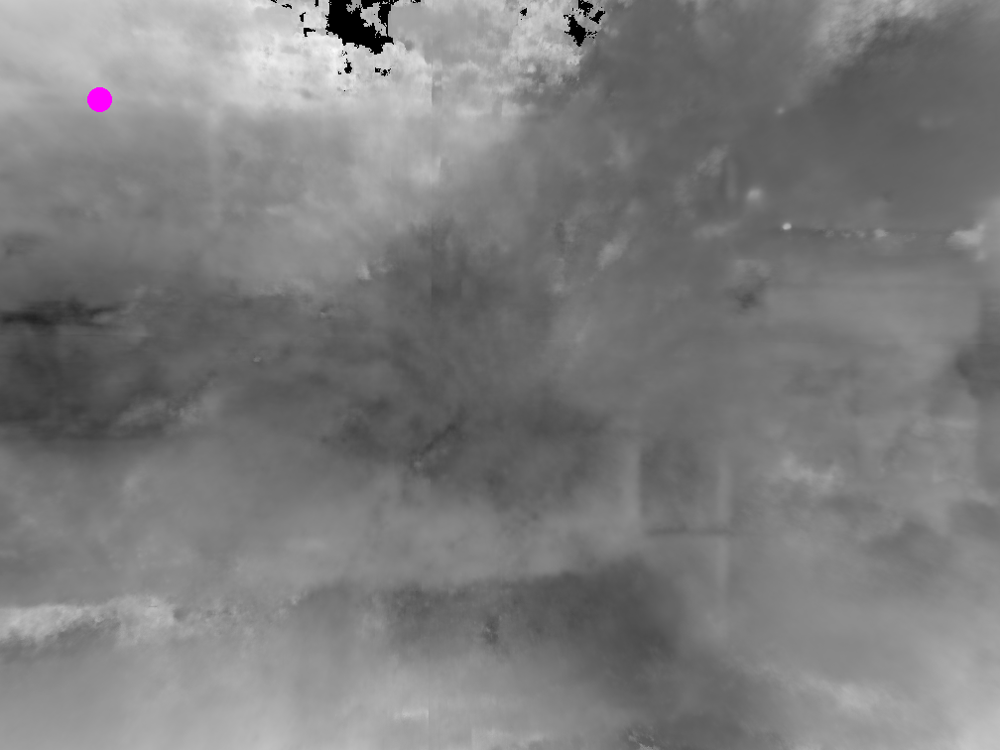

In [24]:
to_pil_image = T.ToPILImage()
colors = [
    np.array([0,0,255]), np.array([255,0,0]), np.array([0,255,0]),
    np.array([255,255,0]), np.array([255,0,255]), np.array([255,255,255])
]

# hwc to chw
img_1 = to_pil_image(img_1_tensor.permute(2, 0, 1))
img_2_for_preds = to_pil_image(img_2_tensor.permute(2, 0, 1))

orig_draw_r = 4
found_draw_r = 4
k = 5
img_1_drw = ImageDraw.Draw(img_1, 'RGBA')
img_2_preds_drw = ImageDraw.Draw(img_2_for_preds, 'RGBA')

heat_maps = []

for i, point in enumerate(points_to_check):
    # Draw on source image to see it
    print(point)
    # Draw ellipse given a bounding box of (x0,y0,x1,y1), x in width, y in height, x1>x0 y1>y0
    img_1_drw.ellipse(xy=(point[1] - orig_draw_r, point[0] - orig_draw_r, \
                          point[1] + orig_draw_r, point[0] + orig_draw_r), fill=tuple(colors[i]))

    # Fine nearest Neighbors
    point_features = features_1[point[0], point[1]]
    # distances = ((features_2 - point_features) ** 2).sum(axis=-1)
    distances = cos_sim(features_2, point_features[np.newaxis, np.newaxis,...])
    nearest_idxs = np.dstack(np.unravel_index(np.argsort(-distances, axis=None), distances.shape))[0, :k, ...]

    print(point)
    for n_p in nearest_idxs:
        print(n_p, distances[n_p[0], n_p[1]])

    nearest_p = nearest_idxs[0]
    # Draw ellipse given a bounding box of (x0,y0,x1,y1), x in width, y in height, x1>x0 y1>y0
    img_2_preds_drw.ellipse(xy=(nearest_p[1] - found_draw_r, nearest_p[0] - found_draw_r, \
                          nearest_p[1] + found_draw_r, nearest_p[0] + found_draw_r), fill=tuple(colors[i]))
    # Now draw next matches with lower 
    for near_p in nearest_idxs[1:]:
        img_2_preds_drw.ellipse(xy=(near_p[1] - found_draw_r, near_p[0] - found_draw_r, \
                              near_p[1] + found_draw_r, near_p[0] + found_draw_r),
                          fill=(colors[i][0], colors[i][1], colors[i][2], 100))
    
    # Heatmaps:
    cur_heatmap = (distances + 1)/2
    cur_heatmap_as_img = to_pil_image((np.dstack([cur_heatmap, cur_heatmap, cur_heatmap]) * 255).astype(dtype=np.uint8))
    cur_heatmap_drw = ImageDraw.Draw(cur_heatmap_as_img, 'RGBA')
    cur_heatmap_drw.ellipse(xy=(100 - 3 * orig_draw_r, 100 - 3 * orig_draw_r, \
                          100 + 3 * orig_draw_r, 100 + 3 * orig_draw_r), fill=tuple(colors[i]))
    heat_maps.append(cur_heatmap_as_img)

display('img1', (img_1))
display('img2 preds', (img_2_for_preds))

for i, h_map in enumerate(heat_maps):
    # h_map_as_img = to_pil_image((np.dstack([h_map, h_map, h_map]) * 255).astype(dtype=np.uint8))
    display(i, h_map)
    
